## Transfer Learning of Facebook `Detr-resnet-50` on KITTI dataset
#### Author: Huaze Liu
#### Anoucement: Most of the code are following the instructions in `readme` file of Detr repo. The code of `COCO_dataset` class is from [THIS REPO](https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb)

In [1]:
!nvidia-smi

Wed Dec 11 01:31:40 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.107.02             Driver Version: 550.107.02     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        Off |   00000000:81:00.0 Off |                  Off |
| 33%   40C    P0             62W /  450W |       1MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
import os
HOME = os.getcwd()
print(HOME)

/mnt/cs/cs153/projects/bbz-huaze


### 1. Experiment Set-up
- use `pip` to install the necessary library
- import the used library

In [5]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
  Attempting uninstall: supervision
    Found existing installation: supervision 0.26.0rc1
    Uninstalling supervision-0.26.0rc1:
      Successfully uninstalled supervision-0.26.0rc1


In [7]:
import cv2
import torch
import random
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
import requests
import roboflow
import numpy as np
import torchvision
import transformers
from PIL import Image
import pytorch_lightning
import supervision as sv
import pytorch_lightning as pl
from torchvision.ops import nms
import matplotlib.pyplot as plt
from pytorch_lightning import Trainer
from torch.utils.data import DataLoader
from transformers import DetrConfig, DetrForObjectDetection, DetrImageProcessor, DeformableDetrForObjectDetection, AutoImageProcessor
%matplotlib inline

print(
    "roboflow:", roboflow.__version__,
    "; supervision:", sv.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Wed_Nov_22_10:17:15_PST_2023
Cuda compilation tools, release 12.3, V12.3.107
Build cuda_12.3.r12.3/compiler.33567101_0
torch:  2.5 ; cuda:  cu124
roboflow: 1.1.49 ; supervision: 0.3.0 ; transformers: 4.47.0.dev0 ; pytorch_lightning: 2.4.0


### 2. Inference with the pre-trained DeTR model on COCO dataset

#### 2.1 Download Data 
- demo on one image

In [7]:
IMAGE_PATH = '/mnt/cs/cs153/projects/bbz-huaze/dog.jpeg'

#### 2.2 Load the Model

In [11]:
# settings
DEVICE = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
# CHECKPOINT = 'facebook/deformable-detr-box-supervised'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
# image_processor = AutoImageProcessor.from_pretrained(CHECKPOINT)
# model = DeformableDetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

#### 2.3 Inference + NMS

Detections(xyxy=array([[6.7612206e+01, 2.5231702e+02, 6.3454388e+02, 1.0283966e+03],
       [7.5346470e-01, 2.6315414e+02, 6.4631927e+02, 1.2667156e+03],
       [9.1233730e-01, 6.5678479e+02, 5.1248938e+02, 1.2730061e+03],
       [6.2620184e+02, 7.3113458e+02, 6.9654919e+02, 7.8737787e+02]],
      dtype=float32), class_id=array([18,  1, 27,  3]), confidence=array([0.95348257, 0.9365458 , 0.91449964, 0.88314134], dtype=float32), tracker_id=None)


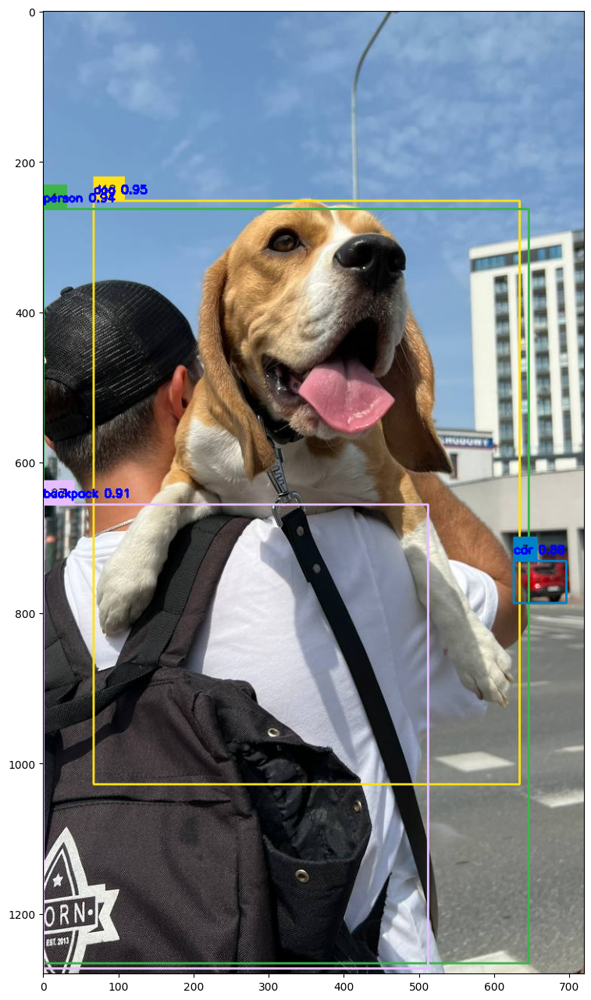

In [9]:
with torch.no_grad():
    # load image & predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

print(detections)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.2f}"
    for xyxy, confidence, class_id in zip(detections.xyxy, detections.confidence, detections.class_id)
]

box_annotator = sv.BoxAnnotator()

# exclude 'labels'
frame = box_annotator.annotate(scene=image, detections=detections)
# Use OpenCV
for i, label in enumerate(labels):
    x1, y1, x2, y2 = map(int, detections.xyxy[i])
    # put labels on the detection boxex
    cv2.putText(
        frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2
    )
sv.show_frame_in_notebook(frame, (16, 16))

### 3. Create COCO-style KITTI data loaders

In [13]:
import albumentations as A

augmentation_train = A.Compose(
    [
        A.Perspective(p=0.1),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
    ],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=25
    ),
)

augmentation_valid = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=1
    ),
)

A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.


In [20]:
DATASET_ROOT = "/mnt/cs/cs153/projects/bbz-huaze/datasets/KITTI-7"
ANNOTATION_FILE_NAME = "_annotations.coco.json"

TRAIN_DIRECTORY = os.path.join(DATASET_ROOT, "train")
VAL_DIRECTORY = os.path.join(DATASET_ROOT, "valid")
TEST_DIRECTORY = os.path.join(DATASET_ROOT, "test")

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor
        self.train = train

    def __getitem__(self, idx):
        image, annotations = super(CocoDetection, self).__getitem__(idx)

        # image: PIL Image
        # annotations: list of dict with keys like 'bbox', 'category_id'
        image = np.array(image)  # Convert to numpy for albumentations

        # Convert COCO bbox (x, y, w, h) to pascal_voc (x_min, y_min, x_max, y_max)
        bboxes = []
        category_ids = []
        for ann in annotations:
            x, y, w, h = ann["bbox"]
            x_min, y_min, x_max, y_max = x, y, x + w, y + h
            bboxes.append([x_min, y_min, x_max, y_max])
            category_ids.append(ann["category_id"])

        # Choose augmentation depending on train or not
        if self.train:
            transformed = augmentation_train(image=image, bboxes=bboxes, category=category_ids)
        else:
            transformed = augmentation_valid(image=image, bboxes=bboxes, category=category_ids)

        aug_image = transformed["image"]
        aug_bboxes = transformed["bboxes"]
        aug_category_ids = transformed["category"]

        # Convert pascal_voc bboxes back to coco format (x, y, w, h)
        transformed_annotations = []
        for box, cat_id in zip(aug_bboxes, aug_category_ids):
            x_min, y_min, x_max, y_max = box
            w = x_max - x_min
            h = y_max - y_min
            area = w * h
            transformed_annotations.append(
                {
                    "bbox": [x_min, y_min, w, h],
                    "category_id": cat_id,
                    "area": area,
                    "iscrowd": 0  # 如果数据集中没有iscrowd，可默认0
                }
            )

        # Convert augmented image back to PIL
        aug_image = Image.fromarray(aug_image)

        # Now pass the augmented image and annotations into the image_processor
        annotations_dict = {'image_id': self.ids[idx], 'annotations': transformed_annotations}
        encoding = self.image_processor(images=aug_image, annotations=annotations_dict, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Number of training examples: 5223
Number of validation examples: 1495
Number of test examples: 746


#### 3.1 Visualize the Data Entry

Image #558


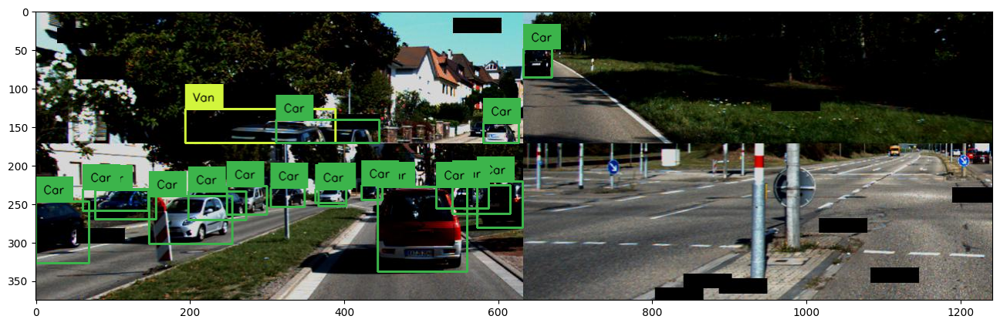

In [21]:
# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

sv.show_frame_in_notebook(image, (16, 16))

#### 3.2 Creare batch

We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask` to indicate which pixels are real (1)/which are padding (0).

In [22]:
def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible
    # to directly batch together images. Hence they pad the images to the biggest
    # resolution in a given batch, and create a corresponding binary pixel_mask
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)
     

### 4. Train model with PyTorch Lightning

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add a feature extractor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [23]:
class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # learn more about it here
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

In [24]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [25]:
outputs.logits.shape

torch.Size([4, 100, 10])

In [26]:
%cd {HOME}

MAX_EPOCHS = 50
trainer = Trainer(devices=[1], accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | eval
--------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.015   Total estimated model params size (MB)
0         Modules

/mnt/cs/cs153/projects/bbz-huaze


Sanity Checking: |                                                                                            …

/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |                                                                                                   …

Validation: |                                                                                                 …

/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_epochs=50` reached.


In [27]:
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

In [28]:
MODEL_PATH = os.path.join(HOME, 'custom-model-aug')

In [29]:
model.model.save_pretrained(MODEL_PATH)

### 5. Save and Call Models

In [30]:
MODEL_PATH = "custom-model"

In [12]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH, output_attentions=True)
model.to(DEVICE)

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

### 6. Inference on test dataset

Image #361
ground truth


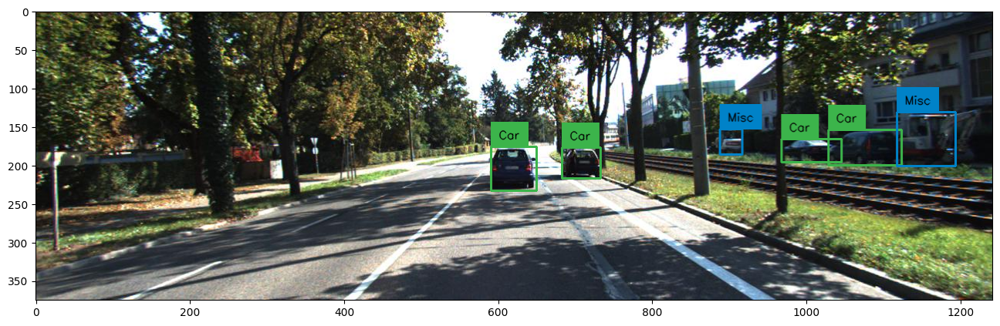

detections


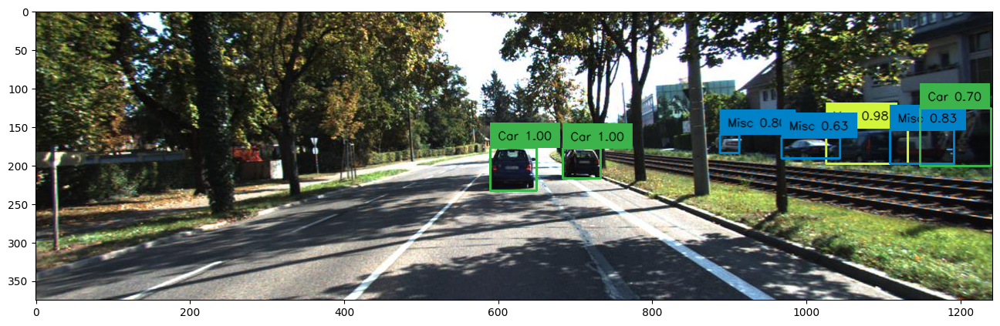

In [20]:
import random
import cv2
import numpy as np


# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('ground truth')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad():

    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

### 7. Evaluation on test dataset

In [32]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [33]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm
import numpy as np
import time

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])
evaluator_categ = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])

print("Running evaluation...")

time_total = []

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
        start_time = time.time()
        outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)
        inference_time = time.time() - start_time
    time_total.append(inference_time)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(
        outputs, target_sizes=orig_target_sizes
    )

    predictions = {target["image_id"].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)
    evaluator_categ.update(predictions)  # For class-wise AP

# mean inference time
mean_inference_time = np.mean(time_total)
std = np.std(time_total)
print(f"Inference Time: {mean_inference_time:.4f} ± {std:.4f} seconds")

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()


Running evaluation...


  0%|          | 0/187 [00:00<?, ?it/s]

Inference Time: 0.0176 ± 0.0043 seconds
Accumulating evaluation results...
DONE (t=0.13s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.380
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.645
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.397
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.384
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.483
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.308
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.486
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.399
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.497
 Average Rec

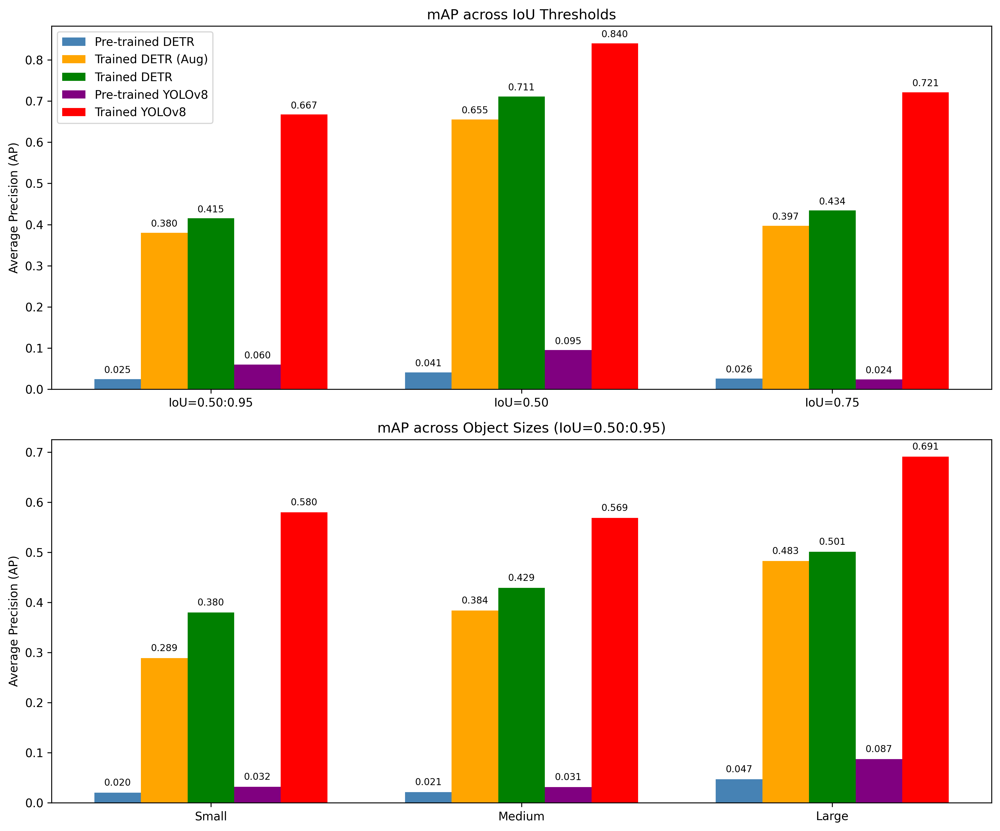

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Data for AP across IoU thresholds
categories_iou = ['IoU=0.50:0.95', 'IoU=0.50', 'IoU=0.75']
pretrained_detr = [0.025, 0.041, 0.026]
trained_detr_aug = [0.380, 0.655, 0.397]
trained_detr = [0.415, 0.711, 0.434]
pretrained_yolo = [0.060, 0.095, 0.024]
trained_yolo = [0.667, 0.840, 0.721]

# Data for AP across object sizes
categories_size = ['Small', 'Medium', 'Large']
pretrained_detr_size = [0.020, 0.021, 0.047]
trained_detr_aug_size = [0.289, 0.384, 0.483]
trained_detr_size = [0.380, 0.429, 0.501]
pretrained_yolo_size = [0.032, 0.031, 0.087]
trained_yolo_size = [0.580, 0.569, 0.691]

bar_width = 0.15
x_iou = np.arange(len(categories_iou))
x_size = np.arange(len(categories_size))

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), dpi=300)

# Plot for IoU thresholds
ax1.bar(x_iou - 2*bar_width, pretrained_detr, width=bar_width, label='Pre-trained DETR', color='steelblue')
ax1.bar(x_iou - bar_width, trained_detr_aug, width=bar_width, label='Trained DETR (Aug)', color='orange')
ax1.bar(x_iou, trained_detr, width=bar_width, label='Trained DETR', color='green')
ax1.bar(x_iou + bar_width, pretrained_yolo, width=bar_width, label='Pre-trained YOLOv8', color='purple')
ax1.bar(x_iou + 2*bar_width, trained_yolo, width=bar_width, label='Trained YOLOv8', color='red')

ax1.set_xticks(x_iou)
ax1.set_xticklabels(categories_iou)
ax1.set_ylabel('Average Precision (AP)')
ax1.set_title('mAP across IoU Thresholds')
ax1.legend()

# Add value labels for ax1
for i, v in enumerate(pretrained_detr):
    ax1.text(x_iou[i] - 2*bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_detr_aug):
    ax1.text(x_iou[i] - bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_detr):
    ax1.text(x_iou[i], v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(pretrained_yolo):
    ax1.text(x_iou[i] + bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_yolo):
    ax1.text(x_iou[i] + 2*bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)

# Plot for object sizes (with IoU=0.50:0.95 annotation)
ax2.bar(x_size - 2*bar_width, pretrained_detr_size, width=bar_width, label='Pre-trained DETR', color='steelblue')
ax2.bar(x_size - bar_width, trained_detr_aug_size, width=bar_width, label='Trained DETR (Aug)', color='orange')
ax2.bar(x_size, trained_detr_size, width=bar_width, label='Trained DETR', color='green')
ax2.bar(x_size + bar_width, pretrained_yolo_size, width=bar_width, label='Pre-trained YOLOv8', color='purple')
ax2.bar(x_size + 2*bar_width, trained_yolo_size, width=bar_width, label='Trained YOLOv8', color='red')

ax2.set_xticks(x_size)
ax2.set_xticklabels(categories_size)
ax2.set_ylabel('Average Precision (AP)')
ax2.set_title('mAP across Object Sizes (IoU=0.50:0.95)')

# Add value labels for ax2
for i, v in enumerate(pretrained_detr_size):
    ax2.text(x_size[i] - 2*bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_detr_aug_size):
    ax2.text(x_size[i] - bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_detr_size):
    ax2.text(x_size[i], v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(pretrained_yolo_size):
    ax2.text(x_size[i] + bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(trained_yolo_size):
    ax2.text(x_size[i] + 2*bar_width, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig('detr_yolov8_comparison_highres.png', dpi=300)
plt.show()



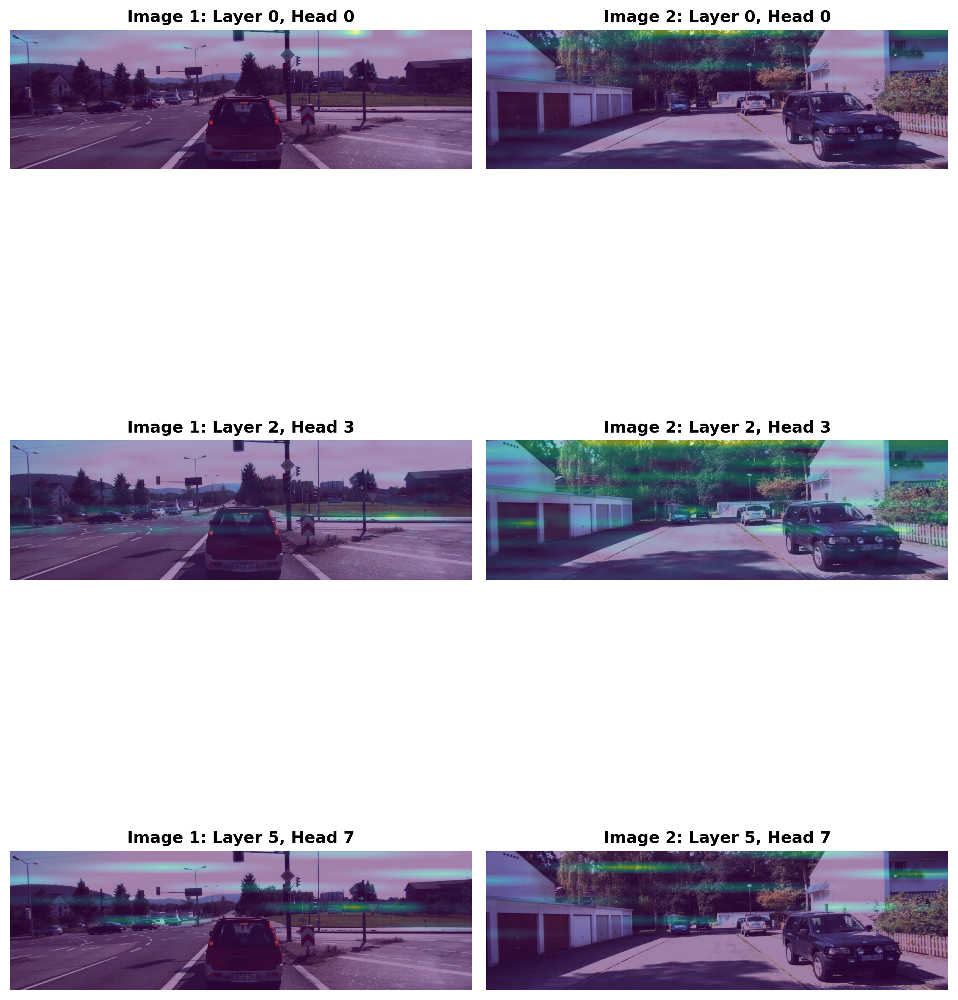

In [41]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import numpy as np

CHECKPOINT = 'facebook/detr-resnet-50'
MODEL_PATH = "custom-model"  # 替换为您的DETR模型路径
layers_and_heads = [
    (0, 0),
    (2, 3),
    (5, 7)
]

path_1 = "datasets/KITTI-7/test/000125_png.rf.42366e18580fc2917590381f6b389b7f.jpg"
path_2 = "datasets/KITTI-7/test/000116_png.rf.491827ebadf20a3ad0ba37a03bfae4eb.jpg"

model = DetrForObjectDetection.from_pretrained(MODEL_PATH, output_attentions=True)
model.eval()

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)

# 假设已知 seq_len 和特征图大小，示例 H_feat=21, W_feat=26
H_feat, W_feat = 21, 26
q_idx = 100  # 您想要查看的token索引

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_attention_overlay(image, layer_idx, head_idx, q_idx, H_feat, W_feat):
    inputs = image_processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)

    encoder_attentions = outputs.encoder_attentions
    attn_map = encoder_attentions[layer_idx][0, head_idx]  # [seq_len, seq_len]
    attn_for_token = attn_map[q_idx]

    attn_for_token_2d = attn_for_token.reshape(H_feat, W_feat).cpu().numpy()

    height, width, _ = image.shape
    resized_attn = Image.fromarray(attn_for_token_2d)
    resized_attn = resized_attn.resize((width, height), Image.BILINEAR)
    resized_attn = np.array(resized_attn)
    return resized_attn

# 加载两张图像
image1 = load_image(path_1)
image2 = load_image(path_2)

# 创建3行2列的子图，每一行对应一个(layer, head)，每行第1列为image1，第2列为image2
fig, axs = plt.subplots(3, 2, figsize=(10, 15), dpi=300)
# fig.suptitle("Attention Overlays for Test Images at Different Layers & Heads", fontsize=16, fontweight='bold')

for row, (layer_idx, head_idx) in enumerate(layers_and_heads):
    # Image 1 overlay
    resized_attn_1 = get_attention_overlay(image1, layer_idx, head_idx, q_idx, H_feat, W_feat)
    axs[row, 0].imshow(image1)
    axs[row, 0].imshow(resized_attn_1, cmap='viridis', alpha=0.5)
    axs[row, 0].set_title(f"Image 1: Layer {layer_idx}, Head {head_idx}", fontsize=12, fontweight='bold')
    axs[row, 0].axis('off')

    # Image 2 overlay
    resized_attn_2 = get_attention_overlay(image2, layer_idx, head_idx, q_idx, H_feat, W_feat)
    axs[row, 1].imshow(image2)
    axs[row, 1].imshow(resized_attn_2, cmap='viridis', alpha=0.5)
    axs[row, 1].set_title(f"Image 2: Layer {layer_idx}, Head {head_idx}", fontsize=12, fontweight='bold')
    axs[row, 1].axis('off')

plt.tight_layout()
plt.savefig('attention_overlay_grid_3x2.png', dpi=300)
plt.show()


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


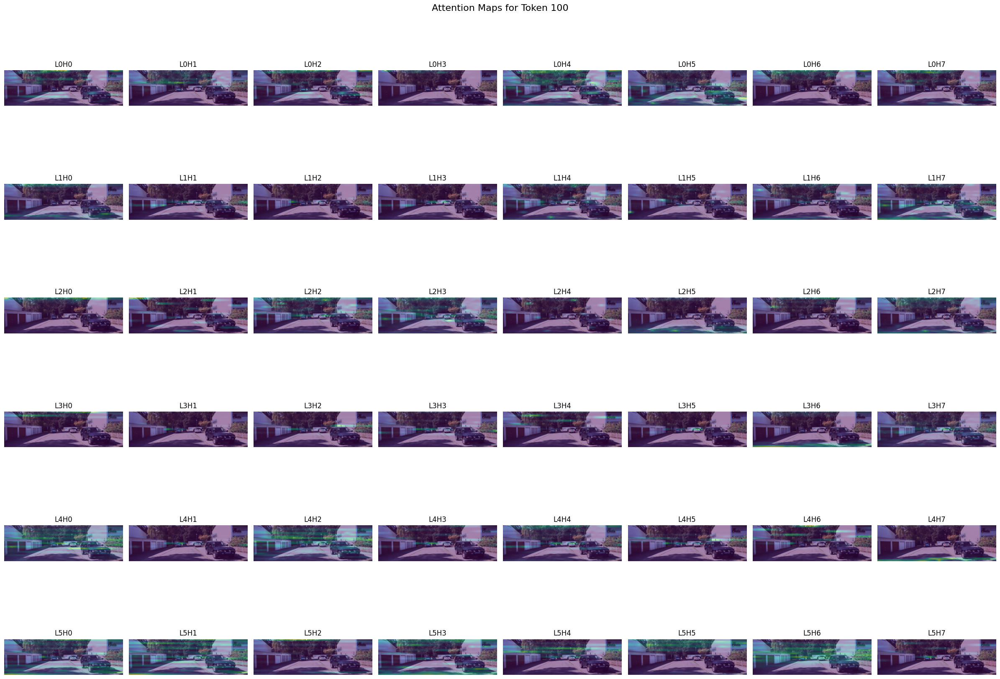

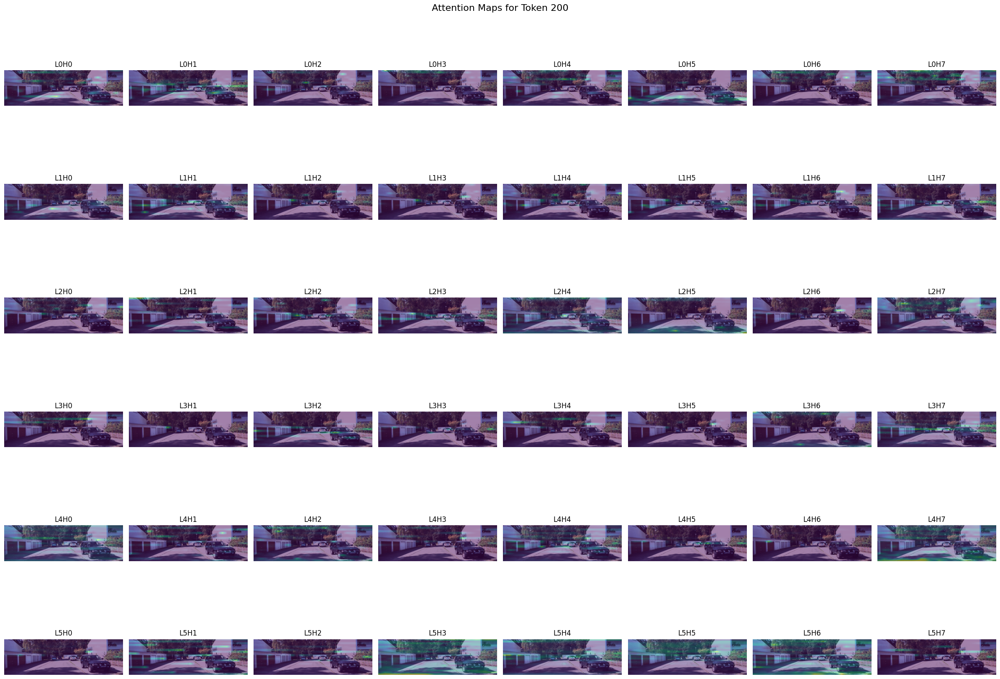

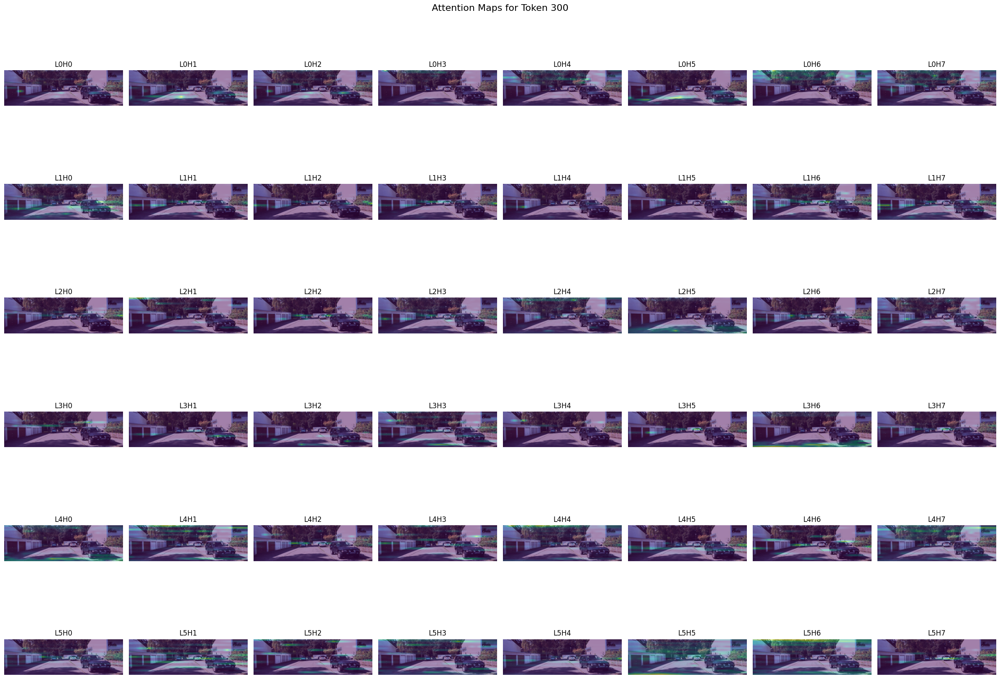

In [22]:
CHECKPOINT = 'facebook/detr-resnet-50'
MODEL_PATH = "custom-model"
layer_count = 6   # DETR的encoder层数，具体可根据config查看
head_count = 8    # 每层的多头注意力头数

model = DetrForObjectDetection.from_pretrained(MODEL_PATH, output_attentions=True)
model.eval()

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)

# 载入一张测试图片
path = "datasets/KITTI-7/test/000116_png.rf.491827ebadf20a3ad0ba37a03bfae4eb.jpg"
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

inputs = image_processor(images=image, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

encoder_attentions = outputs.encoder_attentions  # list of tensors of shape [batch, num_heads, seq_len, seq_len]

# 假设我们知道seq_len = 546，并用21x26来reshape
H_feat, W_feat = 21, 26
q_idx_list = [100, 200, 300]  # 您可以选择几个token来查看，或只选一个

height, width, _ = image.shape

for q_idx in q_idx_list:
    fig, axs = plt.subplots(layer_count, head_count, figsize=(head_count*3, layer_count*3))
    fig.suptitle(f'Attention Maps for Token {q_idx}', fontsize=16)
    
    for l in range(layer_count):
        for h in range(head_count):
            attn_map = encoder_attentions[l][0, h]  # [seq_len, seq_len]
            attn_for_token = attn_map[q_idx]  # [seq_len]

            if attn_for_token.shape[0] != H_feat * W_feat:
                # 如果shape不匹配，需要根据实际seq_len重新分解
                seq_len = attn_for_token.shape[0]
                # 尝试自动因数分解seq_len
                # 此处简单打印seq_len，让您根据实际情况自行确定H_feat, W_feat
                print("seq_len is:", seq_len)
                # 请手动指定H_feat, W_feat，如若无法推断，可根据model config或print出pixel_mask查看特征图大小
                
            attn_for_token_2d = attn_for_token.reshape(H_feat, W_feat).cpu().numpy()

            # 将注意力图resize回原图大小
            resized_attn = Image.fromarray(attn_for_token_2d)
            resized_attn = resized_attn.resize((width, height), Image.BILINEAR)
            resized_attn = np.array(resized_attn)

            axs[l, h].imshow(image)
            axs[l, h].imshow(resized_attn, cmap='viridis', alpha=0.5)
            axs[l, h].set_title(f"L{l}H{h}")
            axs[l, h].axis('off')

    plt.tight_layout()
    plt.show()


### deformable Detr

In [11]:
class def_Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DeformableDetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

In [12]:
model = def_Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Could not load the custom kernel for multi-scale deformable attention: /mnt/home/hualiu/.cache/torch_extensions/py312_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /mnt/home/hualiu/.cache/torch_extensions/py312_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /mnt/home/hualiu/.cache/torch_extensions/py312_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load the custom kernel for multi-scale deformable attention: /mnt/home/hualiu/.cache/torch_extensions/py312_cu124/MultiScaleDeformableAttention/MultiScaleDeformableAttention.so: cannot open shared object file: No such file or directory
Could not load t

In [13]:
%cd {HOME}

MAX_EPOCHS = 50
trainer = Trainer(devices=[1], accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name  | Type                             | Params | Mode
------------------------------------------------------------------
0 | model | DeformableDetrForObjectDetection | 41.0 M | eval
------------------------------------------------------------------
17.6 M    Trainable params
23.5 M    Non-trainable params
41.0 M    Total params
164.136   Total estimated 

/mnt/cs/cs153/projects/bbz-huaze


Sanity Checking: |                                                                                            …

/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |                                                                                                   …

Validation: |                                                                                                 …

/mnt/cs/cs153/projects/bbz-huaze/detr_proj/lib/python3.12/site-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_epochs=50` reached.
